# Parallelization

## Notes on Parallelization in Turing.jl

`~` is only thread safe for observations not assumptions: https://github.com/TuringLang/Turing.jl/blob/master/HISTORY.md

This makes sampling from the prior a bit difficult, since we need to fill the observation with an assumption.
However, the following macro can be used to disable threading depending on a condition. Usage:

```julia
@maybethreads <condition> for ...
```

## Install multi-threaded kernel

```julia
using Pkg
Pkg.activate("")
using IJulia
IJulia.installkernel("Julia 4 Threads", env=Dict(
    "JULIA_NUM_THREADS" => "4",
))
```

In [1]:
using Base.Threads
macro maybethreads(cond, ex)
    return esc(:($cond ? (@threads $ex) : $ex))
end

@maybethreads (macro with 1 method)

In [2]:
@maybethreads true for i in 1:10
    print("$i ")
end
Threads.nthreads()

4 9 1 7 5 8 6 10 2 3 

4

In [3]:
ENV["DISPLAY"]=":1"

":1"

# Setup Environment
## vscode
Using vscode with a custom kernel might result in the X11 DISPLAY variable not being found.
The easiest workaround is to manually set the DISPLAY variable (replace your value from `echo $DISPLAY`):
```julia
ENV["DISPLAY"]=":1"
```

## plotly with jupyter lab
If using Jupyter Lab, install the extension to use plotly.
```shell
conda install nodejs
jupyter labextension install jupyterlab-plotly
```

In [4]:
using Pkg
Pkg.activate(".")
#Pkg.instantiate()
using Revise

  Activating environment at `~/code/mcmc-depth-turing/Project.toml`


# Initialize the **OpenGL** offscreen render context


In [5]:
using MCMCDepthTuring
using SciGL
const WIDTH = const HEIGHT = 100
window, framebuffer, depth_prog = init_render_context(WIDTH, HEIGHT)
# curried render functions for convenience
render_scene(scene) = render_to_cpu(framebuffer, depth_prog, scene)
render_scene(scene, object, t, r) = render_pose(framebuffer, depth_prog, scene, object, t, r)
render_scene!(scene, object, t, r) = render_pose!(framebuffer, depth_prog, scene, object, t, r)

┌ Info: Precompiling MCMCDepthTuring [ea9e20e3-5ec9-4a18-b9a5-f98be19e20e6]
└ @ Base loading.jl:1342
libGL error: failed to open /dev/dri/card0: Permission denied
libGL error: failed to open /dev/dri/card0: Permission denied
libGL error: failed to load driver: iris


render_scene! (generic function with 1 method)

Load the the camera and mesh. Wrap them in a scene for simplified rendering.


In [6]:
using CoordinateTransformations, Rotations, LinearAlgebra
# Fill the scene with objects
const camera = CvCamera(WIDTH, HEIGHT, 1.2 * WIDTH, 1.2 * HEIGHT, WIDTH / 2, HEIGHT / 2) |> SceneObject
const object = load_mesh(depth_prog, "meshes/monkey.obj") |> SceneObject
const cube = load_mesh(depth_prog, "meshes/cube.obj") |> SceneObject
const scene = Scene(camera, [object])
const cube_scene = Scene(camera, [cube])
# Poses of the objects
const T = [0.0, 0.0, 2.0]
const Σ_T = [0.05, 0.05, 0.05]
const COV_T = Diagonal(Σ_T)
const R = [0.0, π, 0.0]
object.pose.t = Translation(T)
object.pose.R = RotZYX(R...)
cube.pose.t = Translation([0.48, 0, 2.0])
cube.pose.R = RotZYX(-0.2, -0.2, 1)
camera.pose.R = lookat(camera, object, [0, 1, 0]);

# Render the nominal scene
This is the scene without any noise in the pose or sensor.

In [7]:
using Images
using BenchmarkTools
# TODO type stability for Inference of return
render_object(t, r)::Matrix{Float32} = render_scene(scene, object, t, r)
nominal_depth = render_object(T, R)
colorize_depth(nominal_depth)
typeof(nominal_depth)

Matrix{Float32} (alias for Array{Float32, 2})

┌ Info: Precompiling PNGFiles [f57f5aa1-a3ce-4bc8-8ab9-96f992907883]
└ @ Base loading.jl:1342


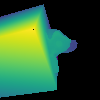

In [8]:
obs_depth = render_scene(cube_scene, object, T, R)
colorize_depth(obs_depth)

# Probabilistic Model


Soss expects a symbol on the left side -> workaround is to encapsulate everything in one function. This also cleans up the code.


Describes how the data is generated given:

- A `scene` with all relevant object, the first object is assumed to be the object of interest
- The RFID measurement for the position with the mean and covariance `mean_t` & `cov_t`
- The model will be conditioned on the depth image `y`


const MAX_DEPTH = 10.0
const PIXEL_σ = 0.05
const PIXEL_θ = 1.0;

## Model

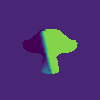

In [9]:
const PRIOR_O = fill(0.1, (WIDTH, HEIGHT))
p_object = pixel_association.(nominal_depth, obs_depth, PRIOR_O, DepthNormal, DepthUniform)
colorize_probability(p_object)

Performance: Only evaluate the pixels which are nonzero in the rendered image.
All the zero pixels don't contribute to the likelihood and thus have the same likelihood: 1.

Handle invalid values ∉[0,MAX_DEPTH]. Our convention for invalid values is to set them to zero.

In [11]:
using Turing


img_log_likelihood(μ, o, z) = sum(Float64.(logpdf.(DepthNormalExponential.(μ, o), z)))

@model function pose_model(mean_t::AbstractVector{<:Real}, cov_t::AbstractMatrix{<:Real}, z, prepocess = true)
    # Position prior based on the RFID Measurement
    t ~ MvNormal(mean_t, cov_t)
    # We don't know anything about the orientation or the occlusion
    r ~ filldist(CircularUniform(), 3)
    o ~ filldist(Uniform(), WIDTH * HEIGHT)
    # Render the pose and preprocess for the likelihood
    μ = vec(render_object(t, r))
    if z === missing
        z = Vector{Float32}(undef, WIDTH * HEIGHT)
    end
    if prepocess
        μ, o, z = preprocess(μ, o, z)
    end
    # robust for transformation as𝕀 ∈ (0,1), might get 0.0 or very close
    o = [x < eps() ? eps() : x for x in o]
    o = [x > 1 - eps() ? 1 - eps() : x for x in o]
    # TODO Mixture not working with Threads zero(Any)
    Turing.@addlogprob! img_log_likelihood(μ, o, z)
    # z .~ DepthNormal.(μ)
end

prior_sampler = pose_model(T, COV_T, vec(nominal_depth), true)
μ1 = prior_sampler()
#colorize_depth(reshape(μ1, 100, 100))
using Random
@code_warntype prior_sampler.f(
    prior_sampler,
    Turing.VarInfo(prior_sampler),
    Turing.SamplingContext(
        Random.GLOBAL_RNG, Turing.SampleFromPrior(), Turing.DefaultContext(),
    ),
    prior_sampler.args...,
)

Variables
  #self#::Core.Const(pose_model)
  __model__::DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}
  __varinfo__@_3::DynamicPPL.TypedVarInfo{NamedTuple{(:t, :r, :o), Tuple{DynamicPPL.Metadata{Dict{AbstractPPL.VarName{:t, Setfield.IdentityLens}, Int64}, Vector{DiagNormal}, Vector{AbstractPPL.VarName{:t, Setfield.IdentityLens}}, Vector{Float64}, Vector{Set{DynamicPPL.Selector}}}, DynamicPPL.Metadata{Dict{AbstractPPL.VarName{:r, Setfield.IdentityLens}, Int64}, Vector{Product{Continuous, CircularUniform, FillArrays.Fill{CircularUniform, 1, Tuple{Base.OneTo{Int64}}}}}, Vector{AbstractPPL.VarName{:r, Setfield.IdentityLens}}, Vector{Float64}, Vector{Set{DynamicPPL.Selector}}}, DynamicPPL.Metadata{Dict{AbstractPPL.VarName{:o, Setfield.IdentityLens}, Int64}, Vector{Product{Continuous, Uniform{Float64}, FillArrays.Fill{Uniform{

In [12]:
prior_chain = sample(prior_sampler, MH(), MCMCThreads(), 10, 4);

LoadError: TaskFailedException

[91m    nested task error: [39mTaskFailedException
    Stacktrace:
     [1] [0m[1mwait[22m
    [90m   @ [39m[90m./[39m[90;4mtask.jl:322[0m[90m [inlined][39m
     [2] [0m[1mthreading_run[22m[0m[1m([22m[90mfunc[39m::[0mFunction[0m[1m)[22m
    [90m   @ [39m[90mBase.Threads[39m [90m./[39m[90;4mthreadingconstructs.jl:34[0m
     [3] [0m[1mmacro expansion[22m
    [90m   @ [39m[90m./[39m[90;4mthreadingconstructs.jl:93[0m[90m [inlined][39m
     [4] [0m[1mmacro expansion[22m
    [90m   @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:342[0m[90m [inlined][39m
     [5] [0m[1m(::AbstractMCMC.var"#34#45"{Bool, Base.Iterators.Pairs{Symbol, UnionAll, Tuple{Symbol}, NamedTuple{(:chain_type,), Tuple{UnionAll}}}, Int64, Int64, Vector{Any}, Vector{UInt64}, Vector{DynamicPPL.Sampler{MH{(), NamedTuple{(), Tuple{}}}}}, Vector{DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}}, Vector{Random._GLOBAL_RNG}})[22m[0m[1m([22m[0m[1m)[22m
    [90m   @ [39m[35mAbstractMCMC[39m [90m./[39m[90;4mtask.jl:411[0m
    
    [91m    nested task error: [39mMethodError: no method matching zero(::Type{Any})
        [0mClosest candidates are:
        [0m  zero(::Type{Union{Missing, T}}) where T at missing.jl:105
        [0m  zero([91m::Union{Type{P}, P}[39m) where P<:Dates.Period at /buildworker/worker/package_linux64/build/usr/share/julia/stdlib/v1.6/Dates/src/periods.jl:53
        [0m  zero([91m::FillArrays.Fill{T, N, Axes} where Axes[39m) where {T, N} at /home/rd/.julia/packages/FillArrays/Vzxer/src/FillArrays.jl:540
        [0m  ...
        Stacktrace:
          [1] [0m[1mzero[22m[0m[1m([22m[90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mmissing.jl:106[0m
          [2] [0m[1mreduce_empty[22m[0m[1m([22m[90m#unused#[39m::[0mtypeof(+), [90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:311[0m
          [3] [0m[1mreduce_empty[22m[0m[1m([22m[90m#unused#[39m::[0mtypeof(Base.add_sum), [90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:320[0m
          [4] [0m[1mmapreduce_empty[22m[0m[1m([22m[90m#unused#[39m::[0mtypeof(identity), [90mop[39m::[0mFunction, [90mT[39m::[0mType[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:343[0m
          [5] [0m[1mreduce_empty[22m[0m[1m([22m[90mop[39m::[0mBase.MappingRF[90m{typeof(identity), typeof(Base.add_sum)}[39m, [90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:329[0m
          [6] [0m[1mreduce_empty_iter[22m
        [90m    @ [39m[90m./[39m[90;4mreduce.jl:355[0m[90m [inlined][39m
          [7] [0m[1mmapreduce_empty_iter[22m[0m[1m([22m[90mf[39m::[0mFunction, [90mop[39m::[0mFunction, [90mitr[39m::[0mVector[90m{Any}[39m, [90mItrEltype[39m::[0mBase.HasEltype[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:351[0m
          [8] [0m[1m_mapreduce[22m[0m[1m([22m[90mf[39m::[0mtypeof(identity), [90mop[39m::[0mtypeof(Base.add_sum), [90m#unused#[39m::[0mIndexLinear, [90mA[39m::[0mVector[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:400[0m
          [9] [0m[1m_mapreduce_dim[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:318[0m[90m [inlined][39m
         [10] [0m[1m#mapreduce#672[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:310[0m[90m [inlined][39m
         [11] [0m[1mmapreduce[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:310[0m[90m [inlined][39m
         [12] [0m[1m#_sum#682[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:878[0m[90m [inlined][39m
         [13] [0m[1m_sum[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:878[0m[90m [inlined][39m
         [14] [0m[1m#_sum#681[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:877[0m[90m [inlined][39m
         [15] [0m[1m_sum[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:877[0m[90m [inlined][39m
         [16] [0m[1m#sum#679[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:873[0m[90m [inlined][39m
         [17] [0m[1msum[22m[0m[1m([22m[90ma[39m::[0mVector[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreducedim.jl:873[0m
         [18] [0m[1mimg_log_likelihood[22m[0m[1m([22m[90mμ[39m::[0mVector[90m{Float32}[39m, [90mo[39m::[0mVector[90m{Float64}[39m, [90mz[39m::[0mVector[90m{Float32}[39m[0m[1m)[22m
        [90m    @ [39m[35mMain[39m [90m./[39m[90;4mIn[11]:4[0m
         [19] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mutils.jl:12[0m[90m [inlined][39m
         [20] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcompiler.jl:529[0m[90m [inlined][39m
         [21] [0m[1mpose_model[22m[0m[1m([22m[90m__model__[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90m__varinfo__[39m::[0mDynamicPPL.ThreadSafeVarInfo[90m{DynamicPPL.UntypedVarInfo{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}, Vector{Base.RefValue{Float64}}}[39m, [90m__context__[39m::[0mDynamicPPL.SamplingContext[90m{DynamicPPL.SampleFromPrior, DynamicPPL.DefaultContext, Random._GLOBAL_RNG}[39m, [90mmean_t[39m::[0mVector[90m{Float64}[39m, [90mcov_t[39m::[0mDiagonal[90m{Float64, Vector{Float64}}[39m, [90mz[39m::[0mVector[90m{Float32}[39m, [90mprepocess[39m::[0mBool[0m[1m)[22m
        [90m    @ [39m[35mMain[39m [90m./[39m[90;4mIn[11]:24[0m
         [22] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:489[0m[90m [inlined][39m
         [23] [0m[1m_evaluate!![22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:472[0m[90m [inlined][39m
         [24] [0m[1mevaluate_threadsafe!![22m[0m[1m([22m[90mmodel[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90mvarinfo[39m::[0mDynamicPPL.UntypedVarInfo[90m{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}[39m, [90mcontext[39m::[0mDynamicPPL.SamplingContext[90m{DynamicPPL.SampleFromPrior, DynamicPPL.DefaultContext, Random._GLOBAL_RNG}[39m[0m[1m)[22m
        [90m    @ [39m[36mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:463[0m
         [25] [0m[1mevaluate!![22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:402[0m[90m [inlined][39m
         [26] [0m[1mevaluate!![22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:415[0m[90m [inlined][39m
         [27] [0m[1mModel[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:377[0m[90m [inlined][39m
         [28] [0m[1mVarInfo[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mvarinfo.jl:127[0m[90m [inlined][39m
         [29] [0m[1mVarInfo[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mvarinfo.jl:126[0m[90m [inlined][39m
         [30] [0m[1mstep[22m[0m[1m([22m[90mrng[39m::[0mRandom._GLOBAL_RNG, [90mmodel[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90mspl[39m::[0mDynamicPPL.Sampler[90m{MH{(), NamedTuple{(), Tuple{}}}}[39m; [90mresume_from[39m::[0mNothing, [90mkwargs[39m::[0mBase.Iterators.Pairs[90m{Union{}, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}[39m[0m[1m)[22m
        [90m    @ [39m[36mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4msampler.jl:81[0m
         [31] [0m[1mstep[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4msampler.jl:74[0m[90m [inlined][39m
         [32] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:123[0m[90m [inlined][39m
         [33] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4mlogging.jl:15[0m[90m [inlined][39m
         [34] [0m[1mmcmcsample[22m[0m[1m([22m[90mrng[39m::[0mRandom._GLOBAL_RNG, [90mmodel[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90msampler[39m::[0mDynamicPPL.Sampler[90m{MH{(), NamedTuple{(), Tuple{}}}}[39m, [90mN[39m::[0mInt64; [90mprogress[39m::[0mBool, [90mprogressname[39m::[0mString, [90mcallback[39m::[0mNothing, [90mdiscard_initial[39m::[0mInt64, [90mthinning[39m::[0mInt64, [90mchain_type[39m::[0mType, [90mkwargs[39m::[0mBase.Iterators.Pairs[90m{Union{}, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}[39m[0m[1m)[22m
        [90m    @ [39m[32mAbstractMCMC[39m [90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:114[0m
         [35] [0m[1m#sample#3[22m
        [90m    @ [39m[90m~/.julia/packages/Turing/npSXP/src/inference/[39m[90;4mInference.jl:159[0m[90m [inlined][39m
         [36] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:351[0m[90m [inlined][39m
         [37] [0m[1m(::AbstractMCMC.var"#1016#threadsfor_fun#46"{UnitRange{Int64}, Bool, Base.Iterators.Pairs{Symbol, UnionAll, Tuple{Symbol}, NamedTuple{(:chain_type,), Tuple{UnionAll}}}, Int64, Vector{Any}, Vector{UInt64}, Vector{DynamicPPL.Sampler{MH{(), NamedTuple{(), Tuple{}}}}}, Vector{DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}}, Vector{Random._GLOBAL_RNG}})[22m[0m[1m([22m[90monethread[39m::[0mBool[0m[1m)[22m
        [90m    @ [39m[32mAbstractMCMC[39m [90m./[39m[90;4mthreadingconstructs.jl:81[0m
         [38] [0m[1m(::AbstractMCMC.var"#1016#threadsfor_fun#46"{UnitRange{Int64}, Bool, Base.Iterators.Pairs{Symbol, UnionAll, Tuple{Symbol}, NamedTuple{(:chain_type,), Tuple{UnionAll}}}, Int64, Vector{Any}, Vector{UInt64}, Vector{DynamicPPL.Sampler{MH{(), NamedTuple{(), Tuple{}}}}}, Vector{DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Vector{Float32}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}}, Vector{Random._GLOBAL_RNG}})[22m[0m[1m([22m[0m[1m)[22m
        [90m    @ [39m[32mAbstractMCMC[39m [90m./[39m[90;4mthreadingconstructs.jl:48[0m

## Chain tools
Extract a Matrix of a variable using `chain_variable` with dimensions `[n_samples, n_variable]`

Extract the images as a matrix from a sampled chain.
The evaluation is lazy and returns a 3D Matrix with dimensions `[n_samples, width, height]`.

One image can be extracted via [i,:,:] and 

In [18]:
function chain_variable(chain, var_name)
  names = namesingroup(chain, var_name)
  chain[names]
end

chain_variable(prior_chain, :r)

Chains MCMC chain (50×3×1 Array{Float64, 3}):

Iterations        = 1:1:50
Number of chains  = 1
Samples per chain = 50
Wall duration     = 0.68 seconds
Compute duration  = 0.68 seconds
parameters        = r[1], r[2], r[3]
internals         = 

Summary Statistics
  parameters      mean       std   naive_se      mcse       ess      rhat   es ⋯
      Symbol   Float64   Float64    Float64   Float64   Float64   Float64      ⋯

        r[1]    2.9894    1.9331     0.2734    0.1717   45.9351    0.9887      ⋯
        r[2]    3.3435    1.7519     0.2478    0.1214   68.3796    0.9884      ⋯
        r[3]    3.1012    1.6575     0.2344    0.2028   56.2046    0.9852      ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

        r[1]    0.2203    1.0006    3.3117    4.6302    5.9224
        r[2]    0.3676    2.2990    3.3628    4

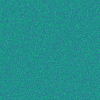

In [19]:
function chain_images(chain, var_name)
  M = chain_variable(chain, var_name) |> Array
  trans = transpose(M)
  resha = reshape(trans, WIDTH, HEIGHT, :)
  permuteddimsview(resha, [3, 1, 2])
end

# Extract the mean of an image matrix
mean_image(img_mat::AbstractArray{T,3}) where {T} = dropdims(mean(img_mat, dims = 1), dims = 1)
chain_images(prior_chain, :o) |> mean_image |> colorize_probability

In [20]:
using StatsPlots
plotly()
function scatter3d_chain(chain, var_name, step = 1, grad = :viridis)
    # Custom iteration to save memory
    M = chain_variable(chain, var_name) |> Array
    l = length(M[:, 1])
    scatter(M[begin:step:end, 1], M[begin:step:end, 2], M[begin:step:end, 3],
        marker_z = [1:step:l...], color = cgrad(:viridis), label = "Sample Number")
end

scatter3d_chain(prior_chain, :t, 2)

┌ Info: For saving to png with the Plotly backend PlotlyBase has to be installed.
└ @ Plots /home/rd/.julia/packages/Plots/Xv2qA/src/backends.jl:432


In [21]:
plot(chain_variable(prior_chain, :r))

In [22]:
summarize(chain_variable(prior_chain, :r))

Summary Statistics
  parameters      mean       std   naive_se      mcse       ess      rhat   es ⋯
      Symbol   Float64   Float64    Float64   Float64   Float64   Float64      ⋯

        r[1]    2.9894    1.9331     0.2734    0.1717   45.9351    0.9887      ⋯
        r[2]    3.3435    1.7519     0.2478    0.1214   68.3796    0.9884      ⋯
        r[3]    3.1012    1.6575     0.2344    0.2028   56.2046    0.9852      ⋯
                                                                1 column omitted


## Samplers
### Prior Proposals
Draws a random sample from the prior distribution. Results in a worse acceptance rate, if the posterior is focused on a small parameter space.

### Gaussian Proposals
Propose a new sample from the old sample `s` by sampling using a normal distribution centered around the value of the old parameter.
Might lead to a higher acceptance rate for focused posteriors.
If the parameters are bounded, e.g. $\lambda$ of a Poisson distribution, this library takes care it by transforming variables to the space of all real numbers and back to the constrained space.

### Gibbs Conditional
Sometimes this is what Gibbs is referred to in the first place.
This assumes that the proposal can be calculated analytically and will always accept the new sample.

In [23]:
using Bijectors
normal_t = MH(:t => t -> Normal.(t, 0.01))
normal_r = MH(:r => r -> Normal.(r, 0.01))
normal_o = MH(:o => o -> Normal.(o, 0.01))
prior_t = MH(:t)
prior_r = MH(:r)
prior_o = MH(:o)

MH{(:o,), NamedTuple{(), Tuple{}}}(NamedTuple())

## Analytic pixel association (Gibbs Conditional)
An analytic solution for the probability of a pixel belonging to the object or not.
* logarithmic formulation is much slower, due to `logaddexp` and the requirement to calculate the non-lograthmic probability, which would require another application of `exp`
* Exponential might make more sense, because Uniform does not consider occlusions -> occluding object might be as likely as the real thing. Some random outliers might still get some likelihood with the exponential
* Probably works better if we have **strong priors**

In [24]:
"""
  cond_o(c)
Implementing the interface of GibbsConditional for the pixel association
"""
function cond_o(c)
  d_is = DepthNormal
  d_not = DepthUniform
  q = PRIOR_O
  μ = render_object(c.t, c.r)
  # Calculated analytically → exact value
  # TODO replace global obs_depth
  pixel_association.(μ, obs_depth, q, d_is, d_not) .|> Dirac
end

const analytic_o = GibbsConditional(:o, cond_o)

GibbsConditional{:o, typeof(cond_o)}(cond_o)

## Evaluation: Sampling

In [31]:
conditioned_model = pose_model(T, COV_T, obs_depth, true)
#normal_chain = sample(conditioned_model, Gibbs(normal_t, normal_r, normal_o), 2000);
normal_chain = sample(conditioned_model, Gibbs(normal_t, normal_r, normal_o), MCMCThreads(), 2000, 4);
# analytic_chain = sample(conditioned_model, Gibbs(normal_t, normal_r, analytic_o), 1000);

LoadError: TaskFailedException

[91m    nested task error: [39mTaskFailedException
    Stacktrace:
     [1] [0m[1mwait[22m
    [90m   @ [39m[90m./[39m[90;4mtask.jl:322[0m[90m [inlined][39m
     [2] [0m[1mthreading_run[22m[0m[1m([22m[90mfunc[39m::[0mFunction[0m[1m)[22m
    [90m   @ [39m[90mBase.Threads[39m [90m./[39m[90;4mthreadingconstructs.jl:34[0m
     [3] [0m[1mmacro expansion[22m
    [90m   @ [39m[90m./[39m[90;4mthreadingconstructs.jl:93[0m[90m [inlined][39m
     [4] [0m[1mmacro expansion[22m
    [90m   @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:342[0m[90m [inlined][39m
     [5] [0m[1m(::AbstractMCMC.var"#34#45"{Bool, Base.Iterators.Pairs{Symbol, UnionAll, Tuple{Symbol}, NamedTuple{(:chain_type,), Tuple{UnionAll}}}, Int64, Int64, Vector{Any}, Vector{UInt64}, Vector{DynamicPPL.Sampler{Gibbs{(:t, :r, :o), Tuple{MH{(:t,), NamedTuple{(:t,), Tuple{AdvancedMH.StaticProposal{false, var"#10#11"}}}}, MH{(:r,), NamedTuple{(:r,), Tuple{AdvancedMH.StaticProposal{false, var"#12#13"}}}}, MH{(:o,), NamedTuple{(:o,), Tuple{AdvancedMH.StaticProposal{false, var"#14#15"}}}}}}}}, Vector{DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}}, Vector{Random._GLOBAL_RNG}})[22m[0m[1m([22m[0m[1m)[22m
    [90m   @ [39m[35mAbstractMCMC[39m [90m./[39m[90;4mtask.jl:411[0m
    
    [91m    nested task error: [39mMethodError: no method matching zero(::Type{Any})
        [0mClosest candidates are:
        [0m  zero(::Type{Union{Missing, T}}) where T at missing.jl:105
        [0m  zero([91m::Union{Type{P}, P}[39m) where P<:Dates.Period at /buildworker/worker/package_linux64/build/usr/share/julia/stdlib/v1.6/Dates/src/periods.jl:53
        [0m  zero([91m::Static.NDIndex{N, I} where I<:Tuple{Vararg{Union{Int64, Static.StaticInt}, N}}[39m) where N at /home/rd/.julia/packages/Static/I7Ldf/src/ndindex.jl:83
        [0m  ...
        Stacktrace:
          [1] [0m[1mzero[22m[0m[1m([22m[90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mmissing.jl:106[0m
          [2] [0m[1mreduce_empty[22m[0m[1m([22m[90m#unused#[39m::[0mtypeof(+), [90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:311[0m
          [3] [0m[1mreduce_empty[22m[0m[1m([22m[90m#unused#[39m::[0mtypeof(Base.add_sum), [90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:320[0m
          [4] [0m[1mmapreduce_empty[22m[0m[1m([22m[90m#unused#[39m::[0mtypeof(identity), [90mop[39m::[0mFunction, [90mT[39m::[0mType[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:343[0m
          [5] [0m[1mreduce_empty[22m[0m[1m([22m[90mop[39m::[0mBase.MappingRF[90m{typeof(identity), typeof(Base.add_sum)}[39m, [90m#unused#[39m::[0mType[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:329[0m
          [6] [0m[1mreduce_empty_iter[22m
        [90m    @ [39m[90m./[39m[90;4mreduce.jl:355[0m[90m [inlined][39m
          [7] [0m[1mmapreduce_empty_iter[22m[0m[1m([22m[90mf[39m::[0mFunction, [90mop[39m::[0mFunction, [90mitr[39m::[0mVector[90m{Any}[39m, [90mItrEltype[39m::[0mBase.HasEltype[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:351[0m
          [8] [0m[1m_mapreduce[22m[0m[1m([22m[90mf[39m::[0mtypeof(identity), [90mop[39m::[0mtypeof(Base.add_sum), [90m#unused#[39m::[0mIndexLinear, [90mA[39m::[0mVector[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreduce.jl:400[0m
          [9] [0m[1m_mapreduce_dim[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:318[0m[90m [inlined][39m
         [10] [0m[1m#mapreduce#672[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:310[0m[90m [inlined][39m
         [11] [0m[1mmapreduce[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:310[0m[90m [inlined][39m
         [12] [0m[1m#_sum#682[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:878[0m[90m [inlined][39m
         [13] [0m[1m_sum[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:878[0m[90m [inlined][39m
         [14] [0m[1m#_sum#681[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:877[0m[90m [inlined][39m
         [15] [0m[1m_sum[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:877[0m[90m [inlined][39m
         [16] [0m[1m#sum#679[22m
        [90m    @ [39m[90m./[39m[90;4mreducedim.jl:873[0m[90m [inlined][39m
         [17] [0m[1msum[22m[0m[1m([22m[90ma[39m::[0mVector[90m{Any}[39m[0m[1m)[22m
        [90m    @ [39m[90mBase[39m [90m./[39m[90;4mreducedim.jl:873[0m
         [18] [0m[1mdot_observe[22m[0m[1m([22m[90mdists[39m::[0mVector[90m{MixtureModel{Univariate, Continuous, Distribution{Univariate, Continuous}, Categorical{Float64, Vector{Float64}}}}[39m, [90mvalue[39m::[0mVector[90m{Float32}[39m, [90mvi[39m::[0mDynamicPPL.ThreadSafeVarInfo[90m{DynamicPPL.UntypedVarInfo{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}, Vector{Base.RefValue{Float64}}}[39m[0m[1m)[22m
        [90m    @ [39m[35mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:622[0m
         [19] [0m[1mdot_observe[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:610[0m[90m [inlined][39m
         [20] [0m[1mdot_tilde_observe[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:563[0m[90m [inlined][39m
         [21] [0m[1mdot_tilde_observe[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:561[0m[90m [inlined][39m
         [22] [0m[1mdot_tilde_observe[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:556[0m[90m [inlined][39m
         [23] [0m[1mdot_tilde_observe!![22m[0m[1m([22m[90mcontext[39m::[0mDynamicPPL.SamplingContext[90m{DynamicPPL.SampleFromPrior, DynamicPPL.DefaultContext, Random._GLOBAL_RNG}[39m, [90mright[39m::[0mVector[90m{MixtureModel{Univariate, Continuous, Distribution{Univariate, Continuous}, Categorical{Float64, Vector{Float64}}}}[39m, [90mleft[39m::[0mVector[90m{Float32}[39m, [90mvi[39m::[0mDynamicPPL.ThreadSafeVarInfo[90m{DynamicPPL.UntypedVarInfo{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}, Vector{Base.RefValue{Float64}}}[39m[0m[1m)[22m
        [90m    @ [39m[35mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:604[0m
         [24] [0m[1mdot_tilde_observe!![22m[0m[1m([22m[90mcontext[39m::[0mDynamicPPL.SamplingContext[90m{DynamicPPL.SampleFromPrior, DynamicPPL.DefaultContext, Random._GLOBAL_RNG}[39m, [90mright[39m::[0mVector[90m{MixtureModel{Univariate, Continuous, Distribution{Univariate, Continuous}, Categorical{Float64, Vector{Float64}}}}[39m, [90mleft[39m::[0mVector[90m{Float32}[39m, [90mvn[39m::[0mAbstractPPL.VarName[90m{:z, Setfield.IdentityLens}[39m, [90mvi[39m::[0mDynamicPPL.ThreadSafeVarInfo[90m{DynamicPPL.UntypedVarInfo{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}, Vector{Base.RefValue{Float64}}}[39m[0m[1m)[22m
        [90m    @ [39m[35mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcontext_implementations.jl:592[0m
         [25] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mcompiler.jl:529[0m[90m [inlined][39m
         [26] [0m[1mpose_model[22m[0m[1m([22m[90m__model__[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90m__varinfo__[39m::[0mDynamicPPL.ThreadSafeVarInfo[90m{DynamicPPL.UntypedVarInfo{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}, Vector{Base.RefValue{Float64}}}[39m, [90m__context__[39m::[0mDynamicPPL.SamplingContext[90m{DynamicPPL.SampleFromPrior, DynamicPPL.DefaultContext, Random._GLOBAL_RNG}[39m, [90mmean_t[39m::[0mVector[90m{Float64}[39m, [90mcov_t[39m::[0mDiagonal[90m{Float64, Vector{Float64}}[39m, [90mz[39m::[0mBase.ReinterpretArray[90m{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}[39m, [90mprepocess[39m::[0mBool[0m[1m)[22m
        [90m    @ [39m[36mMain[39m [90m./[39m[90;4mIn[29]:21[0m
         [27] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:489[0m[90m [inlined][39m
         [28] [0m[1m_evaluate!![22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:472[0m[90m [inlined][39m
         [29] [0m[1mevaluate_threadsafe!![22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:463[0m[90m [inlined][39m
         [30] [0m[1mevaluate!![22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:402[0m[90m [inlined][39m
         [31] [0m[1mevaluate!![22m[0m[1m([22m[90mmodel[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90mrng[39m::[0mRandom._GLOBAL_RNG, [90mvarinfo[39m::[0mDynamicPPL.UntypedVarInfo[90m{DynamicPPL.Metadata{Dict{AbstractPPL.VarName, Int64}, Vector{Distribution}, Vector{AbstractPPL.VarName}, Vector{Real}, Vector{Set{DynamicPPL.Selector}}}, Float64}[39m, [90msampler[39m::[0mDynamicPPL.SampleFromPrior, [90mcontext[39m::[0mDynamicPPL.DefaultContext[0m[1m)[22m
        [90m    @ [39m[35mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:415[0m
         [32] [0m[1m(::DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext})[22m[0m[1m([22m::[0mRandom._GLOBAL_RNG, ::[0mVararg[90m{Any, N} where N[39m[0m[1m)[22m
        [90m    @ [39m[35mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mmodel.jl:377[0m
         [33] [0m[1mVarInfo[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mvarinfo.jl:127[0m[90m [inlined][39m
         [34] [0m[1mVarInfo[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4mvarinfo.jl:126[0m[90m [inlined][39m
         [35] [0m[1mstep[22m[0m[1m([22m[90mrng[39m::[0mRandom._GLOBAL_RNG, [90mmodel[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90mspl[39m::[0mDynamicPPL.Sampler[90m{Gibbs{(:t, :r, :o), Tuple{MH{(:t,), NamedTuple{(:t,), Tuple{AdvancedMH.StaticProposal{false, var"#10#11"}}}}, MH{(:r,), NamedTuple{(:r,), Tuple{AdvancedMH.StaticProposal{false, var"#12#13"}}}}, MH{(:o,), NamedTuple{(:o,), Tuple{AdvancedMH.StaticProposal{false, var"#14#15"}}}}}}}[39m; [90mresume_from[39m::[0mNothing, [90mkwargs[39m::[0mBase.Iterators.Pairs[90m{Union{}, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}[39m[0m[1m)[22m
        [90m    @ [39m[35mDynamicPPL[39m [90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4msampler.jl:81[0m
         [36] [0m[1mstep[22m
        [90m    @ [39m[90m~/.julia/packages/DynamicPPL/c8MjC/src/[39m[90;4msampler.jl:74[0m[90m [inlined][39m
         [37] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:123[0m[90m [inlined][39m
         [38] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4mlogging.jl:15[0m[90m [inlined][39m
         [39] [0m[1mmcmcsample[22m[0m[1m([22m[90mrng[39m::[0mRandom._GLOBAL_RNG, [90mmodel[39m::[0mDynamicPPL.Model[90m{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}[39m, [90msampler[39m::[0mDynamicPPL.Sampler[90m{Gibbs{(:t, :r, :o), Tuple{MH{(:t,), NamedTuple{(:t,), Tuple{AdvancedMH.StaticProposal{false, var"#10#11"}}}}, MH{(:r,), NamedTuple{(:r,), Tuple{AdvancedMH.StaticProposal{false, var"#12#13"}}}}, MH{(:o,), NamedTuple{(:o,), Tuple{AdvancedMH.StaticProposal{false, var"#14#15"}}}}}}}[39m, [90mN[39m::[0mInt64; [90mprogress[39m::[0mBool, [90mprogressname[39m::[0mString, [90mcallback[39m::[0mNothing, [90mdiscard_initial[39m::[0mInt64, [90mthinning[39m::[0mInt64, [90mchain_type[39m::[0mType, [90mkwargs[39m::[0mBase.Iterators.Pairs[90m{Union{}, Union{}, Tuple{}, NamedTuple{(), Tuple{}}}[39m[0m[1m)[22m
        [90m    @ [39m[32mAbstractMCMC[39m [90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:114[0m
         [40] [0m[1m#sample#3[22m
        [90m    @ [39m[90m~/.julia/packages/Turing/npSXP/src/inference/[39m[90;4mInference.jl:159[0m[90m [inlined][39m
         [41] [0m[1mmacro expansion[22m
        [90m    @ [39m[90m~/.julia/packages/AbstractMCMC/BPJCW/src/[39m[90;4msample.jl:351[0m[90m [inlined][39m
         [42] [0m[1m(::AbstractMCMC.var"#1016#threadsfor_fun#46"{UnitRange{Int64}, Bool, Base.Iterators.Pairs{Symbol, UnionAll, Tuple{Symbol}, NamedTuple{(:chain_type,), Tuple{UnionAll}}}, Int64, Vector{Any}, Vector{UInt64}, Vector{DynamicPPL.Sampler{Gibbs{(:t, :r, :o), Tuple{MH{(:t,), NamedTuple{(:t,), Tuple{AdvancedMH.StaticProposal{false, var"#10#11"}}}}, MH{(:r,), NamedTuple{(:r,), Tuple{AdvancedMH.StaticProposal{false, var"#12#13"}}}}, MH{(:o,), NamedTuple{(:o,), Tuple{AdvancedMH.StaticProposal{false, var"#14#15"}}}}}}}}, Vector{DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}}, Vector{Random._GLOBAL_RNG}})[22m[0m[1m([22m[90monethread[39m::[0mBool[0m[1m)[22m
        [90m    @ [39m[32mAbstractMCMC[39m [90m./[39m[90;4mthreadingconstructs.jl:81[0m
         [43] [0m[1m(::AbstractMCMC.var"#1016#threadsfor_fun#46"{UnitRange{Int64}, Bool, Base.Iterators.Pairs{Symbol, UnionAll, Tuple{Symbol}, NamedTuple{(:chain_type,), Tuple{UnionAll}}}, Int64, Vector{Any}, Vector{UInt64}, Vector{DynamicPPL.Sampler{Gibbs{(:t, :r, :o), Tuple{MH{(:t,), NamedTuple{(:t,), Tuple{AdvancedMH.StaticProposal{false, var"#10#11"}}}}, MH{(:r,), NamedTuple{(:r,), Tuple{AdvancedMH.StaticProposal{false, var"#12#13"}}}}, MH{(:o,), NamedTuple{(:o,), Tuple{AdvancedMH.StaticProposal{false, var"#14#15"}}}}}}}}, Vector{DynamicPPL.Model{typeof(pose_model), (:mean_t, :cov_t, :z, :prepocess), (:prepocess,), (), Tuple{Vector{Float64}, Diagonal{Float64, Vector{Float64}}, Base.ReinterpretArray{Float32, 2, Gray{Float32}, Matrix{Gray{Float32}}, true}, Bool}, Tuple{Bool}, DynamicPPL.DefaultContext}}, Vector{Random._GLOBAL_RNG}})[22m[0m[1m([22m[0m[1m)[22m
        [90m    @ [39m[32mAbstractMCMC[39m [90m./[39m[90;4mthreadingconstructs.jl:48[0m

In [31]:
scatter3d_chain(normal_chain, :t, 10)

In [32]:
plot(chain_variable(normal_chain, :t))

In [33]:
plot(chain_variable(normal_chain, :r))

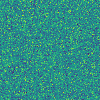

In [34]:
chain_images(normal_chain, :o) |> mean_image |> colorize_probability

In [27]:
function density_variable(samples, var_name)
    flattened_samples = flatten(samples)
    translations = map(x -> state(x)[var_name], flattened_samples)
    translations_matrix = reduce(hcat, translations)
    StatsPlots.density(transpose(translations_matrix))
end
function histogram_variable(samples, var_name, nbins=50)
    flattened_samples = flatten(samples)
    translations = map(x -> state(x)[var_name], flattened_samples)
    translations_matrix = reduce(hcat, translations)
    histogram(transpose(translations_matrix), nbins=nbins)
end
plot(density_variable(analytic_gibbs_samples, :t), histogram_variable(analytic_gibbs_samples, :r), layout = (1, 2))

In [37]:
function probability_image(chains, var_name = :o)
    # Custom iteration to save memory
    n = 0
    accumulated = zeros(WIDTH, HEIGHT)
    for chain in chains
        for sample in chain
            accumulated = accumulated + state(sample)[var_name]
            n = n + 1
        end
    end
    accumulated / n
end
# gibbs_prob_img = probability_image(gibbs_samples) |> colorize_probability |> plot
analytic_gibbs_prob_img = probability_image([analytic_gibbs_samples]) |> colorize_probability |> plot

# Benchmark observation models
- The new model requires some preprocessing but the logdensity can be calculated analytically without extra sampling
- `logsumpexp` seems very expensive, thus use the `BinaryMixture` if possible, which uses `logaddexp`.

In [ ]:
const old_observation_model = @model μ, o begin
    # Sensor model
    occluded .~ MeasureTheory.Bernoulli.(o)
    obs ~ For(eachindex(μ)) do i
        if occluded[i]
            Exponential(PIXEL_θ)
        else
            Normal(μ[i], PIXEL_σ)
        end
    end
end
colorize_depth(reshape(rand(old_observation_model(μ = μ1, o = θ1.o)).obs, (WIDTH,HEIGHT)))

In [ ]:
old_observation_prior = prior(old_observation_model, :obs)
@benchmark begin
    μ1_prep, obs_prep, o_prep = preprocess(μ1, nominal_depth, θ1.o)
    occluded_old = rand(old_observation_prior(μ = μ1_prep, o = o_prep)).occluded
    logdensity(old_observation_model(μ = μ1_prep, o = o_prep) | (; occluded = occluded_old, obs = nominal_depth))
end

In [ ]:
@benchmark begin
    μ1_prep, obs_prep, o_prep = preprocess(μ1, nominal_depth, θ1.o)
    logdensity(observation_model(μ = μ1_prep, o = o_prep) | (; obs = obs_prep))
end

In [ ]:
@benchmark pixel_association(μ666, nominal_depth, prior_is)

In [ ]:
@benchmark pixel_object_probability.(nominal_depth, μ666, PIXEL_σ, PIXEL_θ, prior_is)

# Benchmark Broadcasting vs Loop


In [ ]:
BenchmarkTools.DEFAULT_PARAMETERS.seconds = 60
@benchmark sample_chain(num_samples = 5_000, use_threads=false)

In [ ]:
BenchmarkTools.DEFAULT_PARAMETERS.seconds = 60
@benchmark sample_chain(num_samples = 5_000, use_threads=true)

# Scratchpad

In [ ]:
simple_depth_model = @model scene, mean_t, cov_t begin
    # sensor model
    y .~ Normal.(μ[i], PIXEL_σ)
end;